# Final_PUI -- xy1002

In [283]:
import pandas as pd
import zipfile
import os
import pylab as pl
import geopandas as gpd
import pysal
from geopandas import GeoDataFrame as gdf
import numpy as np
from sklearn.cluster import KMeans
import ast
import json
import urllib
import urllib2
from cStringIO import StringIO
from pandas.tools.plotting import scatter_matrix
from fiona.crs import from_epsg
import shapely
import scipy.stats

%pylab inline

if os.getenv("PUIDATA") is None:
    print ("$PUIDATA to point to set PUIdata dir")

Populating the interactive namespace from numpy and matplotlib


/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['f', 'shape']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


### WARM UP

### 1) Find the number of businesses in 2010 and 2000. This information is available at the zipcode level (HW11).


In [2]:
#2000
if not os.path.isfile(os.getenv('PUIDATA') + '/' + "zbp00totals.zip"):
    !wget ftp://ftp.census.gov/Econ2001_And_Earlier/CBP_CSV/zbp00totals.zip
    os.system('mv zbp00totals.zip ' + os.getenv("PUIDATA")) 
    print('zbp00totals.zip' + ' done!')

In [3]:
#2010
if not os.path.isfile(os.getenv('PUIDATA') + '/' + "zbp10totals.zip"):
    !wget ftp://ftp.census.gov/econ2010/CBP_CSV/zbp10totals.zip
    os.system('mv zbp10totals.zip ' + os.getenv("PUIDATA")) 
    print('zbp10totals.zip' + ' done!')

### 2) Gather a zipcode shapefile and merge the number of businesses with the zipcode shapfile

In [4]:
if not os.path.isfile(os.getenv('PUIDATA') + '/' + 'application%2Fzip'):
    !wget https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip
    !unzip application%2Fzip
    os.system('mv application%2Fzip ' + os.getenv("PUIDATA")) 
    os.system('mv ZIP* ' + os.getenv("PUIDATA")) 



In [72]:
zc_shape = gpd.read_file(os.getenv("PUIDATA") + "/ZIP_CODE_040114.shp")
zc_shape.head()


,AREA,BLDGZIP,COUNTY,CTY_FIPS,POPULATION,PO_NAME,SHAPE_AREA,SHAPE_LEN,STATE,ST_FIPS,URL,ZIPCODE,geometry
0,2.269930e+07,0,Queens,081,18681.0,Jamaica,0.0,0.0,NY,36,http://www.usps.com/,11436,"POLYGON ((1038098.251871482 188138.3800067157,..."
1,2.963100e+07,0,Kings,047,62426.0,Brooklyn,0.0,0.0,NY,36,http://www.usps.com/,11213,"POLYGON ((1001613.712964058 186926.4395172149,..."
2,4.197210e+07,0,Kings,047,83866.0,Brooklyn,0.0,0.0,NY,36,http://www.usps.com/,11212,"POLYGON ((1011174.275535807 183696.33770971, 1..."
3,2.369863e+07,0,Kings,047,56527.0,Brooklyn,0.0,0.0,NY,36,http://www.usps.com/,11225,"POLYGON ((995908.3654508889 183617.6128015518,..."
4,3.686880e+07,0,Kings,047,72280.0,Brooklyn,0.0,0.0,NY,36,http://www.usps.com/,11218,"POLYGON ((991997.1134308875 176307.4958601296,..."


In [77]:
zc_data = zc_shape[['ZIPCODE', 'geometry','PO_NAME']]
zc_data.rename(columns={'PO_NAME': 'boro_name'}, inplace=True)
for y in [2000, 2010]:
    fname = "zbp{}totals.zip".format(str(y)[2:])
    zf = zipfile.ZipFile(os.getenv('PUIDATA') + '/Final/' + fname)
    df = pd.read_csv(zf.open(fname.replace('.zip','.txt')))
    df.rename(columns={'ZIP': 'ZIPCODE','zip': 'ZIPCODE', 'EST': 'est_{}'.format(str(y)[2:]), \
                       'est': 'est_{}'.format(str(y)[2:])}, inplace=True)
    df['ZIPCODE'] = df['ZIPCODE'].astype(str)
    zc_data = pd.merge(zc_data, df[['ZIPCODE','est_{}'.format(str(y)[2:])]], on = 'ZIPCODE') 
zc_data.head()


,ZIPCODE,geometry,boro_name,est_00,est_10
0,11436,"POLYGON ((1038098.251871482 188138.3800067157,...",Jamaica,65,98
1,11213,"POLYGON ((1001613.712964058 186926.4395172149,...",Brooklyn,477,675
2,11212,"POLYGON ((1011174.275535807 183696.33770971, 1...",Brooklyn,520,699
3,11225,"POLYGON ((995908.3654508889 183617.6128015518,...",Brooklyn,417,580
4,11218,"POLYGON ((991997.1134308875 176307.4958601296,...",Brooklyn,1161,1474


### 3) Find the density of businesses by dividing the number of businesses by the area of the zipcode (see the hints file if you need to) and show them the density in a choroplath (a heatmap version of a geographical map where each zipcode (census tract later) is a different color based on the value of the feature you are mapping) for 2000 and 2010 (OPTIONALLY: also show the difference in business density between 2000 and 2010 in a map, this will help you make sure you are on the right track)

In [113]:
zc_data['area(mi^2)'] = zc_data.to_crs(epsg=2263).geometry.area/(2.788*10**7)
zc_data['B_density_00'] = zc_data['est_00'] / zc_data['area(mi^2)']
zc_data['B_density_10'] = zc_data['est_10'] / zc_data['area(mi^2)']
zc_data['diff'] = zc_data['est_10'] - zc_data['est_00']
zc_data.head()

,ZIPCODE,geometry,boro_name,est_00,est_10,area(mi^2),B_density_00,B_density_10,diff
0,11436,"POLYGON ((1038098.251871482 188138.3800067157,...",Jamaica,65,98,0.814178,79.835076,120.366730,33
1,11213,"POLYGON ((1001613.712964058 186926.4395172149,...",Brooklyn,477,675,1.062805,448.812325,635.111781,198
2,11212,"POLYGON ((1011174.275535807 183696.33770971, 1...",Brooklyn,520,699,1.505456,345.410371,464.311249,179
3,11225,"POLYGON ((995908.3654508889 183617.6128015518,...",Brooklyn,417,580,0.850023,490.575177,682.334778,163
4,11218,"POLYGON ((991997.1134308875 176307.4958601296,...",Brooklyn,1161,1474,1.322410,877.942333,1114.631351,313


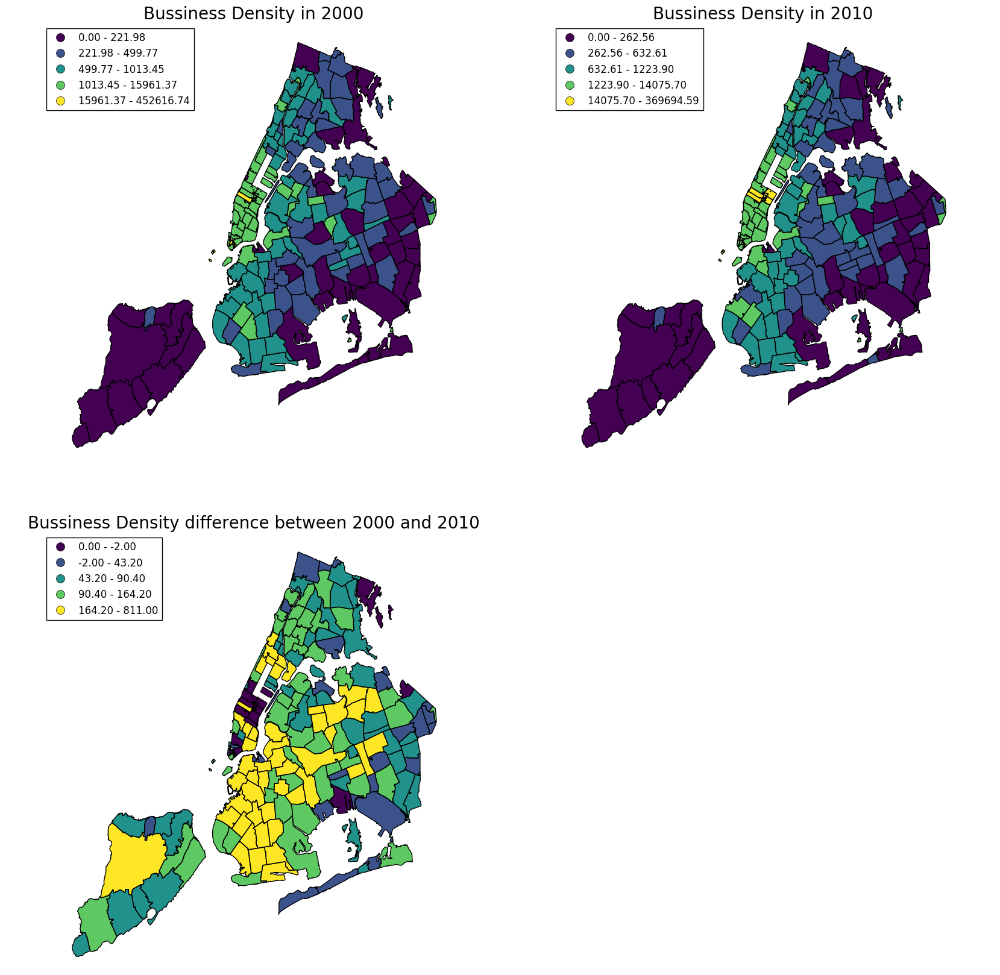

In [121]:
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
zc_data.plot(column = 'B_density_00' , cmap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Bussiness Density in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
zc_data.plot(column = 'B_density_10' , cmap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Bussiness Density in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
zc_data.plot(column = 'diff' , cmap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Bussiness Density difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 1 shows the business density in NYC in 2000, yellow means larger density, so that we can see the desity is obviously lager than others. 
#### Figure 2 shows the business density in NYC in 2010, yellow means larger density, so that we can see the desity is obviously lager than others. 
#### FIgure 3 shows the business density changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown, and the increase mostly happened in manhattan updown and brooklyn. 

## MORE SERIOUS STUFF

### 4) Collect census data from the 2010 and 2000 census and extract the estimate (mean or median) age, population, and diversity of each census tract for all 5 NYC boroughs. The diversity (or lack thereof) can be measured by the fraction of white population.


In [11]:
#Function for downloding data using SQL
SQL_SOURCE = 'https://fb55.cartodb.com/api/v2/sql'

def queryCartoDB(query, format='CSV', source=SQL_SOURCE):
    """queries data from CartoDB SQL database
    Arguments:
    query: a string like 
            SELECT colum_name_1, column_name_2 FROM database_name
    format: the file format (e.g. CSV, GeoJson)
    source: the sql database url link
    Return:
        database as a string to be read in with the appropriate function
    """
    data = urllib.urlencode({'format': format, 'q': query})
    try:
        response = urllib2.urlopen(source, data)
    except urllib2.HTTPError, e:
        raise ValueError('\n'.join(ast.literal_eval(e.readline())['error']))
    except Exception:
        raise
    return StringIO(response.read())

# call as:
#datastream = queryCartoDB(query, format='CSV')
#data       = pd.read_csv(database_name)

In [12]:
#Download Census 2000
query = 'SELECT * FROM DEC_00_SF1_DP1'
datastream = queryCartoDB(query, format='CSV')
Census_00 = pd.read_csv(datastream)

In [13]:
#Extract geo_id, total population, white population and Median age from census 2000
C_00 = Census_00[['geo_id', 'hc01_vc01', 'hc02_vc29', 'hc01_vc18']]
C_00.rename(columns={'hc01_vc01': 'Tot_pop_00', 'hc02_vc29': 'White_pop(%)_00', 'hc01_vc18': 'Age_m_00', \
                    }, inplace=True)
C_00.head(3)

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/pandas/core/frame.py:2754: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  **kwargs)


,geo_id,Tot_pop_00,White_pop(%)_00,Age_m_00
0,1400000US36047054300,0,NaN,0.0
1,1400000US36081121100,0,NaN,0.0
2,1400000US36005003700,478,18.4,22.0


In [14]:
#Download Census 2010
query = 'SELECT * FROM DEC_10_SF1_SF1DP1'
datastream = queryCartoDB(query, format='CSV')
Census_10 = pd.read_csv(datastream)

In [15]:
#Extract geo_id, total population, white population and Median age from census 2010
C_10 = Census_10[['geo_id', 'hd01_s001', 'hd02_s078', 'hd01_s020']]
C_10.rename(columns={'hd01_s001': 'Tot_pop_10', 'hd02_s078': 'White_pop(%)_10', 'hd01_s020': 'Age_m_10', \
                    }, inplace=True)
C_10.head(3)

,geo_id,Tot_pop_10,White_pop(%)_10,Age_m_10
0,1400000US36081038301,0,NaN,0.0
1,1400000US36005002400,4,50.0,38.0
2,1400000US36059990200,0,NaN,0.0


### 5) Collect the income data by census tract from the income from American Fact Finder for the years 2010 and 2000 at the census tract level.



In [16]:
#Download Income Census 2000
query = 'SELECT * FROM DEC_00_SF3_DP3_with_ann'
datastream = queryCartoDB(query, format='CSV')
IC_data_00 = pd.read_csv(datastream)


In [17]:
#Extract geo_id, total population, white population and Median age from census 2010
IC_00 = IC_data_00[['geo_id', 'hc01_vc64']]
IC_00.rename(columns={'hc01_vc64': 'Income_m($)_00'}, inplace=True)
IC_00.head(3)

,geo_id,Income_m($)_00
0,1400000US36089991900,0
1,1400000US36001013703,68929
2,1400000US36005000200,42539


In [18]:
#Download Income Census 2010
query = 'SELECT * FROM ACS_10_5YR_S1901_with_ann'
datastream = queryCartoDB(query, format='CSV')
IC_data_10 = pd.read_csv(datastream)


In [19]:
IC_10 = IC_data_10[['geo_id', 'hc01_est_vc13']]
IC_10.rename(columns={'hc01_est_vc13': 'Income_m($)_10'}, inplace=True)
IC_10 = IC_10[IC_10['Income_m($)_10'].str.isdigit()]
IC_10['Income_m($)_10'] = IC_10['Income_m($)_10'].astype(int)
IC_10.head(3)

,geo_id,Income_m($)_10
0,1400000US36001000100,32333
1,1400000US36001000200,25354
2,1400000US36001000300,30932


### 6) Merge the datasets for each year and show a the tables containing the relevant data: the features and whatever else you need to identify and plot the data.

In [20]:
CTMerge_00 = pd.merge(C_00, IC_00, on = 'geo_id') 
CTMerge_00 = CTMerge_00.dropna()
CTMerge_00.head()

,geo_id,Tot_pop_00,White_pop(%)_00,Age_m_00,Income_m($)_00
2,1400000US36005003700,478,18.4,22.0,23750
3,1400000US36005004900,246,20.7,30.0,25662
4,1400000US36005005800,5,0.0,23.5,6250
5,1400000US36005017100,3,0.0,47.5,0
6,1400000US36005018700,33,21.2,37.3,0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f55ca168050>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f55c9972290>]], dtype=object)

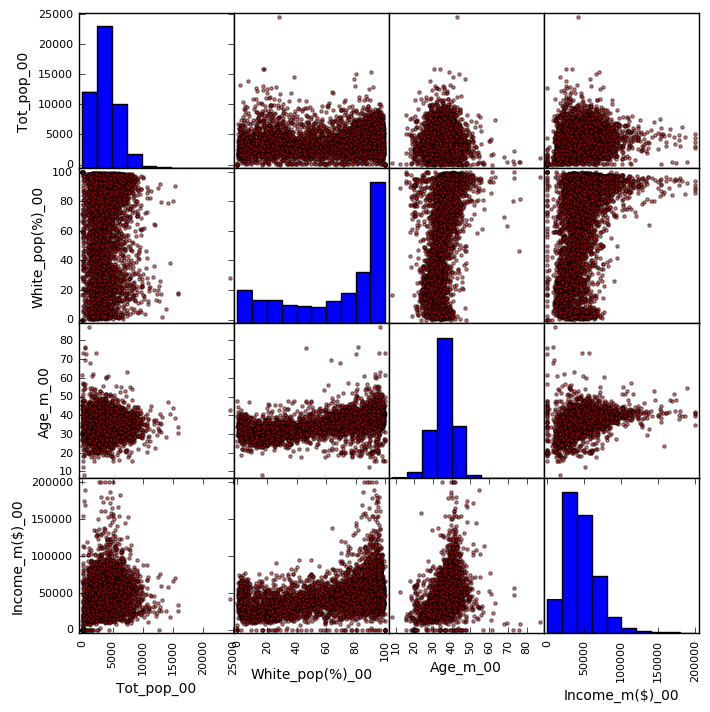

In [26]:
scatter_matrix (CTMerge_00,  alpha = 0.5, figsize=(8, 8), c = 'red')


#### Figure 4 shows the scatter plot of the census tract data in 2000. so that we can see the histogram of each feature.

In [21]:
CTMerge_10 = pd.merge(C_10, IC_10, on = 'geo_id') 
CTMerge_10 = CTMerge_10.dropna()
CTMerge_10.head()

,geo_id,Tot_pop_10,White_pop(%)_10,Age_m_10,Income_m($)_10
0,1400000US36007012900,1532,98.2,59.8,58523
1,1400000US36015010500,2817,92.5,38.9,31502
2,1400000US36047053700,3575,98.7,16.4,30938
3,1400000US36047107000,322,3.4,40.3,56638
4,1400000US36055006300,3071,10.7,33.2,28750


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f55c9427bd0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f55c8d14d10>]], dtype=object)

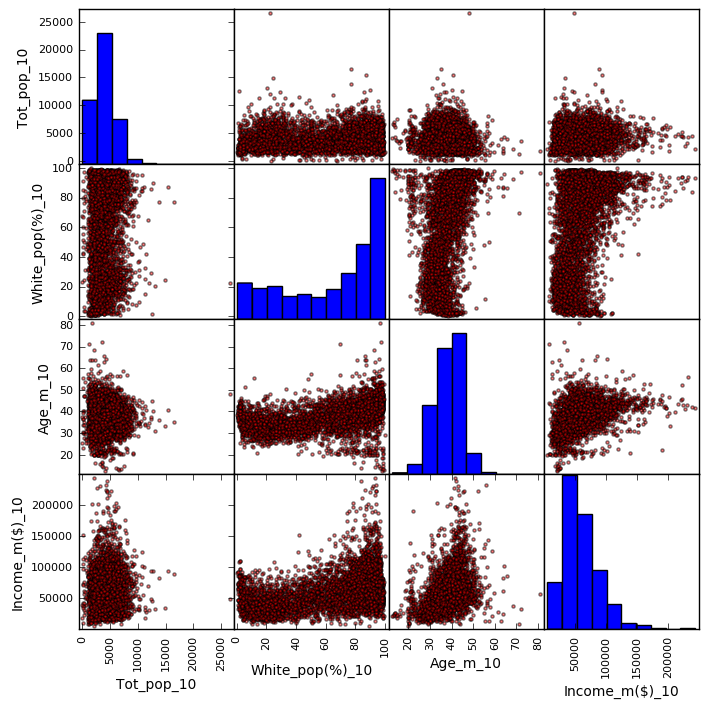

In [27]:
scatter_matrix (CTMerge_10,  alpha = 0.5, figsize=(8, 8), c = 'red')


#### Figure 5 shows the scatter plot of the census tract data in 2010. so that we can see the histogram of each feature.

### 7) Merge the df with the census tracts shapefile (see DATA and HINTS files) and display each of your features as a choropleth for both 2010 and 2000, and show the difference in the features as a third choroplath.

In [28]:
query = 'SELECT * FROM table_2010_census_tracts'
datastream = queryCartoDB(query, format='GeoJSON')
datageo  = json.loads(datastream.read())
ct_shape_10 = gpd.GeoDataFrame.from_features(datageo['features'])

In [29]:
ct_shape_10.head(3)

,boro_code,boro_ct_2010,boro_name,cartodb_id,cdeligibil,ct_2010,ctlabel,geometry,ntacode,ntaname,puma,shape_area,shape_leng
0,3,3050804,Brooklyn,998,E,050804,508.04,"(POLYGON ((-73.96140699999999 40.65217, -73.96...",BK42,Flatbush,4015,1110945.63082,4305.94762341
1,3,3027500,Brooklyn,1261,I,027500,275,"(POLYGON ((-73.935008 40.682764, -73.937932 40...",BK35,Stuyvesant Heights,4003,1743574.56294,5390.78775209
2,2,2009200,Bronx,1294,E,009200,92,"(POLYGON ((-73.847279 40.829315, -73.847320999...",BX59,Westchester-Unionport,3709,3278193.62083,9143.90356952


In [30]:
#Generate geo_id column in census tract shape file
countyID = {'Bronx':'005', 'Manhattan':'061', 'Staten Island':'085','Brooklyn':'047',
       'Queens':'081'}
ct_shape_10['allcodes'] = list(zip(ct_shape_10.boro_name, ct_shape_10.ct_2010))
ct_shape_10['geo_id']  = ct_shape_10[['allcodes']].applymap(lambda x: 
                            ("1400000US36%03d%06d"%(int(countyID[x[0]]),int(x[1]))))


In [31]:
ct_shape_merge = pd.merge(ct_shape_10, CTMerge_00, on = 'geo_id') 
ct_shape_merge = pd.merge(ct_shape_merge, CTMerge_10, on = 'geo_id') 

In [32]:
ct_shape_merge['Tot_pop_diff'] = ct_shape_merge['Tot_pop_10'] - ct_shape_merge['Tot_pop_00']
ct_shape_merge['WhitePop(%)_diff'] = ct_shape_merge['White_pop(%)_10'] - ct_shape_merge['White_pop(%)_00']
ct_shape_merge['Age_diff'] = ct_shape_merge['Age_m_10'] - ct_shape_merge['Age_m_00']
ct_shape_merge['Income_diff'] = ct_shape_merge['Income_m($)_10'] - ct_shape_merge['Income_m($)_00']

In [33]:
ct_shape_merge.head(3)

,boro_code,boro_ct_2010,boro_name,cartodb_id,cdeligibil,ct_2010,ctlabel,geometry,ntacode,ntaname,...,Age_m_00,Income_m($)_00,Tot_pop_10,White_pop(%)_10,Age_m_10,Income_m($)_10,Tot_pop_diff,WhitePop(%)_diff,Age_diff,Income_diff
0,3,3027500,Brooklyn,1261,I,027500,275,"(POLYGON ((-73.935008 40.682764, -73.937932 40...",BK35,Stuyvesant Heights,...,33.9,30241,4180,9.1,35.6,52958,9,7.6,1.7,22717
1,2,2009200,Bronx,1294,E,009200,92,"(POLYGON ((-73.847279 40.829315, -73.847320999...",BX59,Westchester-Unionport,...,31.7,36589,5017,29.5,33.3,45625,140,-0.6,1.6,9036
2,4,4099100,Queens,1306,I,099100,991,"(POLYGON ((-73.791793 40.789352, -73.791563999...",QN49,Whitestone,...,47.1,62341,6507,85.5,51.1,84350,-152,-2.2,4.0,22009


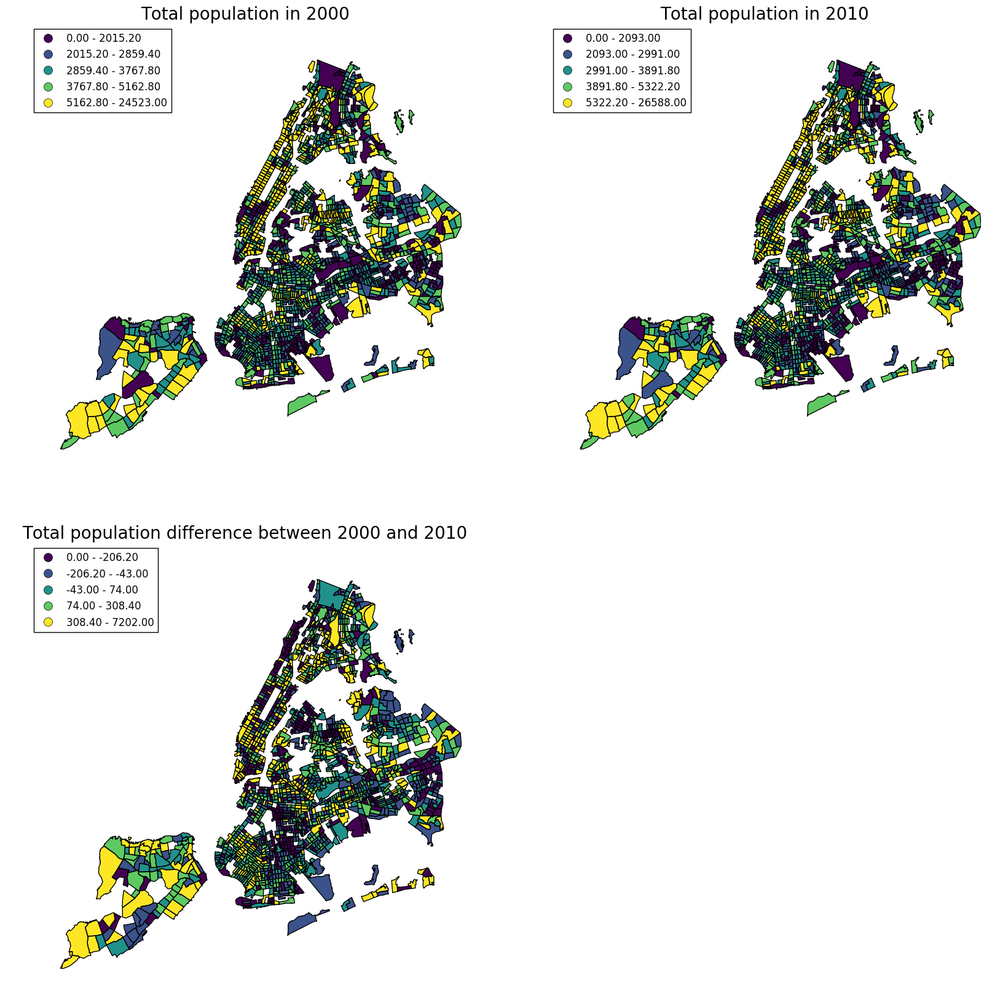

In [120]:
#Total population 
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
ct_shape_merge.plot(column = 'Tot_pop_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Total population in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
ct_shape_merge.plot(column = 'Tot_pop_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Total population in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
ct_shape_merge.plot(column = 'Tot_pop_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Total population difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 6 shows the Total population census tract in NYC in 2000, yellow means more people, so that we can see the population on Mahattan is obviously lager than others.
#### Figure 7  shows the Total population census tract in NYC in 2010, yellow means more people, so that we can see the population on Mahattan is obviously lager than others.
#### FIgure 8 shows the Total population changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown, and the increase mostly happened in manhattan downtown, brooklyn downtown and staten island.

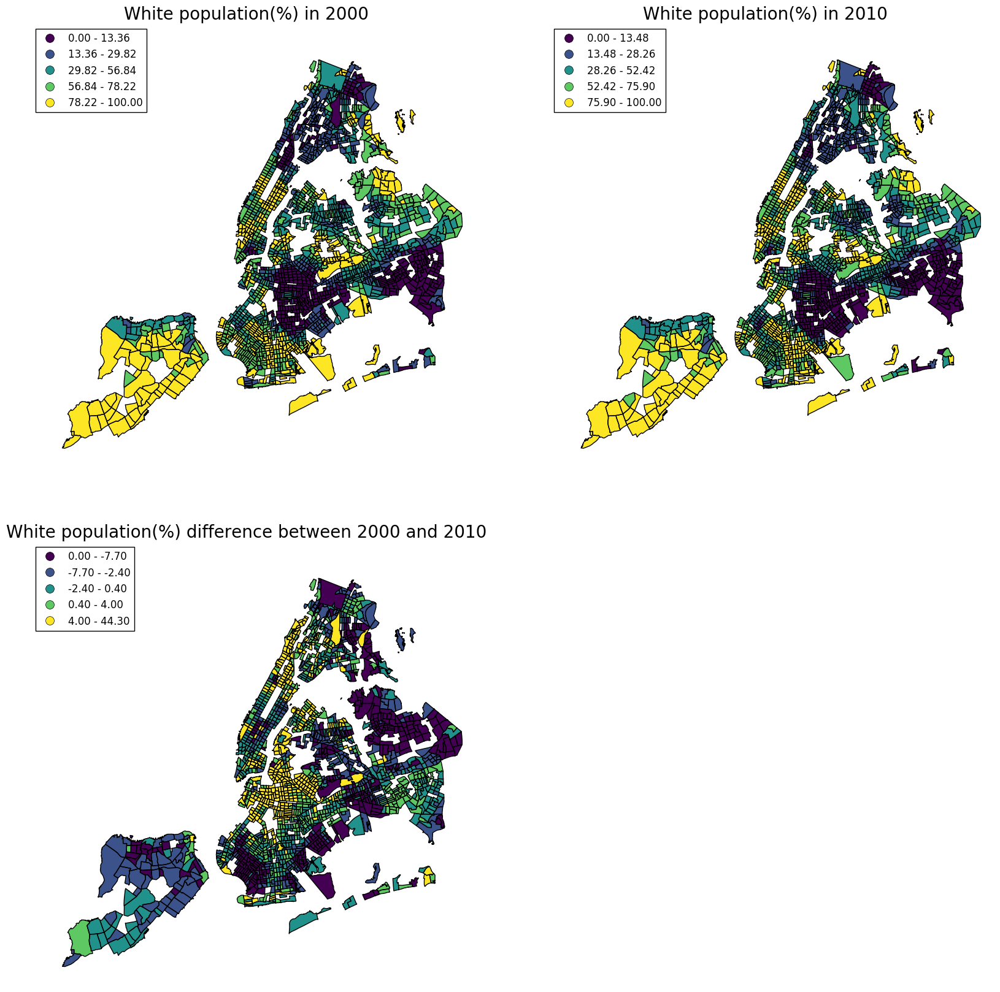

In [122]:
#White population 
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
ct_shape_merge.plot(column = 'White_pop(%)_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("White population(%) in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
ct_shape_merge.plot(column = 'White_pop(%)_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("White population(%) in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
ct_shape_merge.plot(column = 'WhitePop(%)_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("White population(%) difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 9 shows the White population(%) census tract in NYC in 2000, yellow means more people, so that we can see the white population on Mahattan midtown is obviously lager than others.
#### Figure 10  shows the White population(%) census tract in NYC in 2010, yellow means more people, so that we can see the white population on Mahattan midtown is obviously lager than others.
#### FIgure 11 shows the White population(%) changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown, and the increase mostly happened in brooklyn downtown.

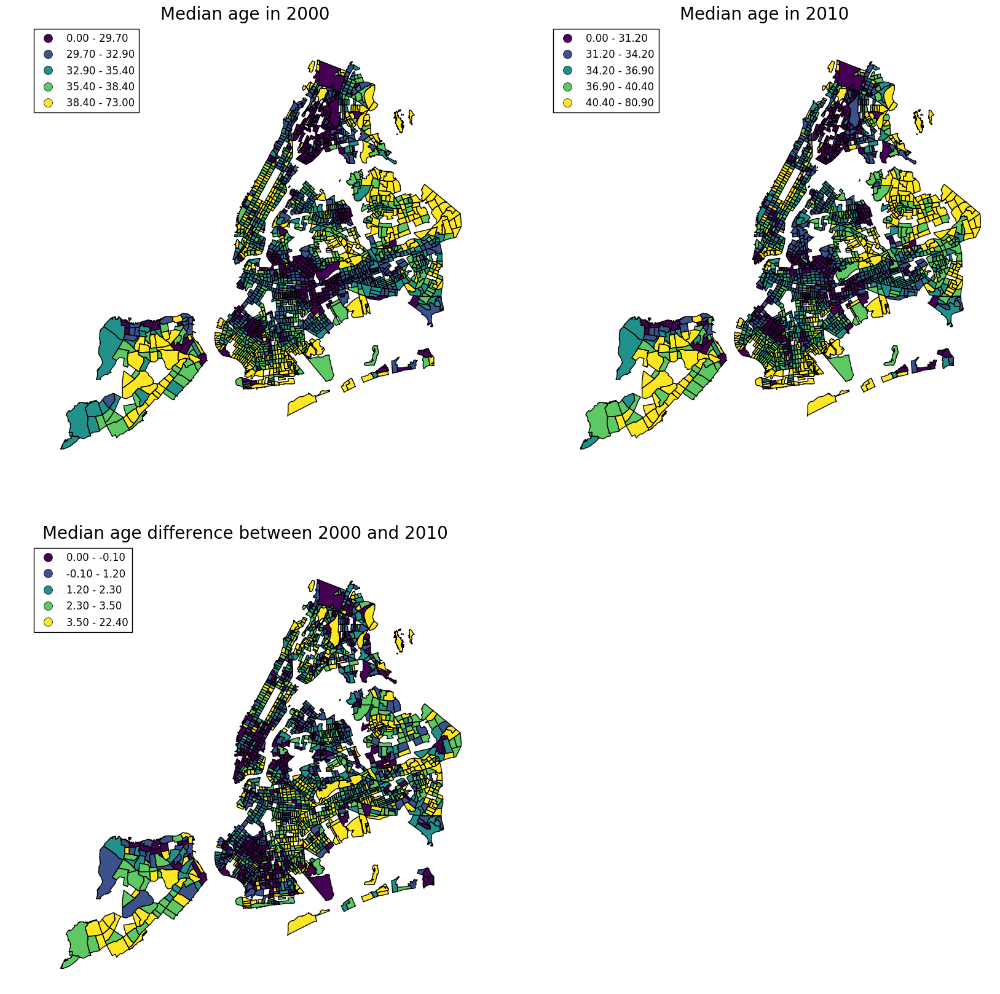

In [123]:
#Age 
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
ct_shape_merge.plot(column = 'Age_m_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Median age in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
ct_shape_merge.plot(column = 'Age_m_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Median age in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
ct_shape_merge.plot(column = 'Age_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Median age difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 12 shows the Median age census tract in NYC in 2000, yellow means elder people, so that we can see the seniors are sparsely distributed around NYC.
#### Figure 13  shows the  Median age census tract in NYC in 2010, yellow means elder people, so that we can see the seniors are sparsely distributed around NYC.
#### FIgure 14 shows the  Median age changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown and brooklyn downtown and the increase mostly happened in stetan island.

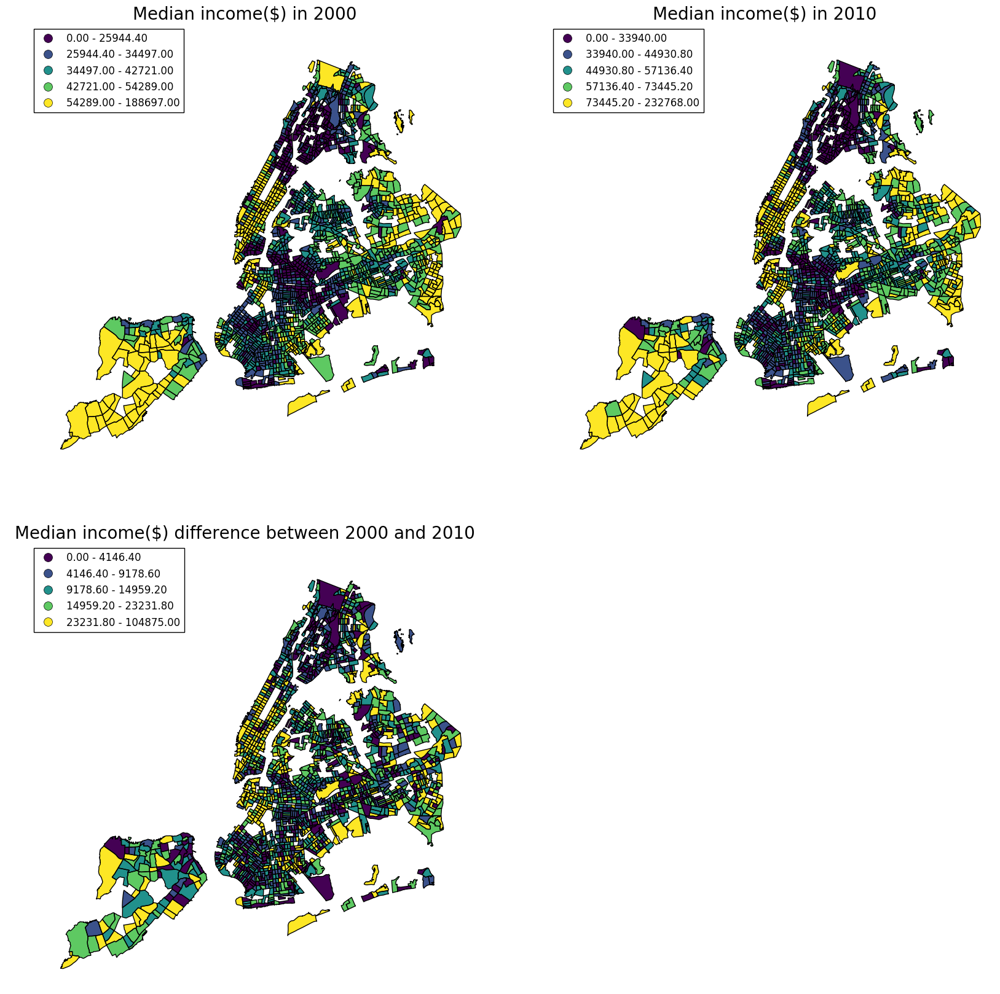

In [124]:
#Median Income
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
ct_shape_merge.plot(column = 'Income_m($)_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Median income($) in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
ct_shape_merge.plot(column = 'Income_m($)_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Median income($) in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
ct_shape_merge.plot(column = 'Income_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Median income($) difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 15 shows the Meian income census tract in NYC in 2000, yellow means high income, so that we can see the the Median income in Manhattan and Stetan island is obviously higher than other area.
#### Figure 16  shows the  Median income census tract in NYC in 2010, yellow means high income, so that we can see the the Median income in Manhattan and Stetan island is obviously higher than other area.
#### FIgure 17 shows the  Median income changes in NYC between 2000 and 2010, we can see that there are generally increas for income in NYC from 2000 to 2010, especially for mahattan midtown there are large increase of income on Manhattan.

8) (OPTIONAL) Cluster the census tracts on these four features (using a Eucledian distance)


9) (OPTIONAL) Identify the census tracts that have changed cluster assignment (those that are now associated with a different group of census tracts) and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes. (Once you get through this, you have done most of the heavy lifting! The rest is building upon this work.)


### 10) Aggregate the census four features at the zipcode level and merge the zipcode dataframe




In [116]:
nyczips = zc_data
nyccensustracts = ct_shape_merge

In [117]:
nyczips.crs = from_epsg(2263)
nyczips = nyczips.to_crs(epsg = 4326)
# epsg=4326: lat/on | 26918: NAD83/UTM zone 18N | epsg=2263 is US feet
nyczips.head(3)

,ZIPCODE,geometry,boro_name,est_00,est_10,area(mi^2),B_density_00,B_density_10,diff
0,11436,POLYGON ((-73.80584847647394 40.68290932644246...,Jamaica,65,98,0.814178,79.835076,120.366730,33
1,11213,"POLYGON ((-73.93739763139813 40.6797295892508,...",Brooklyn,477,675,1.062805,448.812325,635.111781,198
2,11212,POLYGON ((-73.90294132545438 40.67083977590007...,Brooklyn,520,699,1.505456,345.410371,464.311249,179


In [103]:
nyccensustracts['ZIPCODE'] = np.zeros(len(nyccensustracts))
nyccensustracts.head(3)

,boro_code,boro_ct_2010,boro_name,cartodb_id,cdeligibil,ct_2010,ctlabel,geometry,ntacode,ntaname,...,Income_m($)_00,Tot_pop_10,White_pop(%)_10,Age_m_10,Income_m($)_10,Tot_pop_diff,WhitePop(%)_diff,Age_diff,Income_diff,ZIPCODE
0,3,3027500,Brooklyn,1261,I,027500,275,"(POLYGON ((-73.935008 40.682764, -73.937932 40...",BK35,Stuyvesant Heights,...,30241,4180,9.1,35.6,52958,9,7.6,1.7,22717,0.0
1,2,2009200,Bronx,1294,E,009200,92,"(POLYGON ((-73.847279 40.829315, -73.847320999...",BX59,Westchester-Unionport,...,36589,5017,29.5,33.3,45625,140,-0.6,1.6,9036,0.0
2,4,4099100,Queens,1306,I,099100,991,"(POLYGON ((-73.791793 40.789352, -73.791563999...",QN49,Whitestone,...,62341,6507,85.5,51.1,84350,-152,-2.2,4.0,22009,0.0


In [81]:
for i, zc in enumerate(nyczips.geometry):
    shape = shapely.geometry.asShape(zc)
    for j, ct in enumerate(nyccensustracts.geometry):
        point = ct.centroid
        if nyccensustracts['boro_name'].iloc[j] == nyczips['boro_name'].iloc[i]:
            if shape.contains(point):
                nyccensustracts['ZIPCODE'].iloc[j] = nyczips['ZIPCODE'].iloc[i]

In [100]:
nyccensustracts = nyccensustracts[nyccensustracts['ZIPCODE'] != 0]
nyccensustracts_z = nyccensustracts.groupby(nyccensustracts.ZIPCODE).mean()
nyccensustracts_z['ZIPCODE'] = nyccensustracts_z.index
nyccensustracts_z.head()

,cartodb_id,Tot_pop_00,White_pop(%)_00,Age_m_00,Income_m($)_00,Tot_pop_10,White_pop(%)_10,Age_m_10,Income_m($)_10,Tot_pop_diff,WhitePop(%)_diff,Age_diff,Income_diff,ZIPCODE
ZIPCODE,,,,,,,,,,,,,,
10001,1552.500000,2149.333333,63.566667,37.000000,53814.666667,2610.000000,63.550000,34.633333,81678.666667,460.666667,-0.016667,-2.366667,27864.0,10001
10002,1313.142857,6061.142857,35.821429,37.857143,25544.357143,5758.357143,40.385714,39.821429,41051.357143,-302.785714,4.564286,1.964286,15507.0,10002
10003,1234.300000,5294.300000,77.980000,33.970000,67424.400000,5528.200000,76.630000,32.670000,95601.400000,233.900000,-1.350000,-1.300000,28177.0,10003
10004,1241.000000,1111.000000,74.600000,34.300000,105456.000000,731.000000,79.100000,31.100000,112083.000000,-380.000000,4.500000,-3.200000,6627.0,10004
10005,1240.000000,907.000000,67.500000,28.400000,81071.000000,8109.000000,70.200000,29.100000,115472.000000,7202.000000,2.700000,0.700000,34401.0,10005


In [118]:
nycCTZC = pd.merge(zc_data, nyccensustracts_z, on = 'ZIPCODE')
nycCTZC.head(3)

,ZIPCODE,geometry,boro_name,est_00,est_10,area(mi^2),B_density_00,B_density_10,diff,cartodb_id,...,Age_m_00,Income_m($)_00,Tot_pop_10,White_pop(%)_10,Age_m_10,Income_m($)_10,Tot_pop_diff,WhitePop(%)_diff,Age_diff,Income_diff
0,11436,"POLYGON ((1038098.251871482 188138.3800067157,...",Jamaica,65,98,0.814178,79.835076,120.366730,33,1165.800000,...,33.250000,40976.600000,1993.300000,3.640000,35.080000,62520.000000,-68.400000,2.010000,1.830,21543.400000
1,11213,"POLYGON ((1001613.712964058 186926.4395172149,...",Brooklyn,477,675,1.062805,448.812325,635.111781,198,858.250000,...,29.600000,26933.437500,3843.437500,21.056250,31.875000,35751.812500,-122.375000,6.687500,2.275,8818.375000
2,11212,"POLYGON ((1011174.275535807 183696.33770971, 1...",Brooklyn,520,699,1.505456,345.410371,464.311249,179,1138.055556,...,28.427778,22683.777778,4353.666667,4.655556,31.827778,28106.333333,-72.722222,0.972222,3.400,5422.555556


### 11) Repeat steps 7,8,9 at the zipcode level (NOT OPTIONAL AT THE ZIPCODE LEVEL) with the added feature (density of businesses).

#### 11) -> 7) Display each of your features as a choropleth for both 2010 and 2000, and show the difference in the features as a third choroplath.

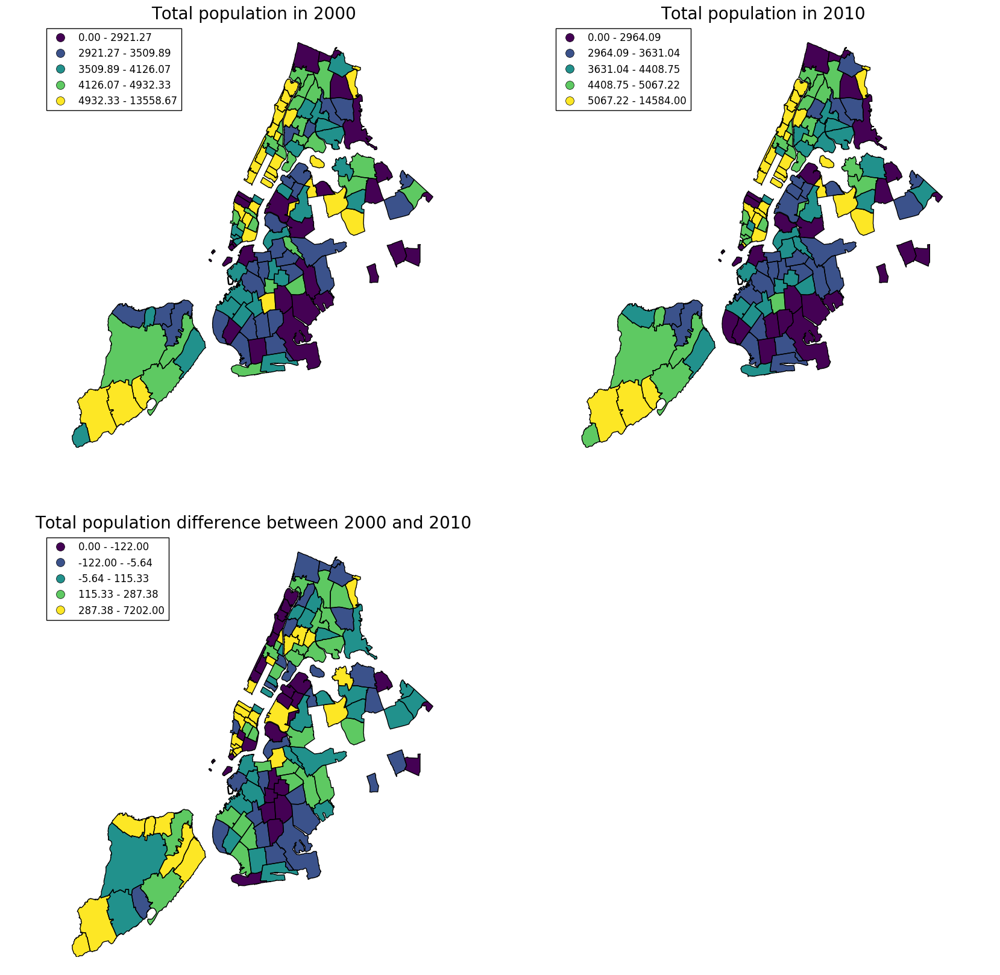

In [125]:
#Total population
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
nycCTZC.plot(column = 'Tot_pop_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Total population in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
nycCTZC.plot(column = 'Tot_pop_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Total population in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
nycCTZC.plot(column = 'Tot_pop_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Total population difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 18 shows the Total population distribution for zipcode level in NYC in 2000, yellow means more people, so that we can see the population on Mahattan is obviously lager than others.
#### Figure 19  shows the Total population distribution for zipcode level in NYC in 2010, yellow means more people, so that we can see the population on Mahattan is obviously lager than others.
#### FIgure 20 shows the Total population changes in NYC between 2000 and 2010, we can see that there are slightly decreass in Manhattan Uptown, and the increase mostly happened in manhattan downtown, brooklyn downtown and staten island.

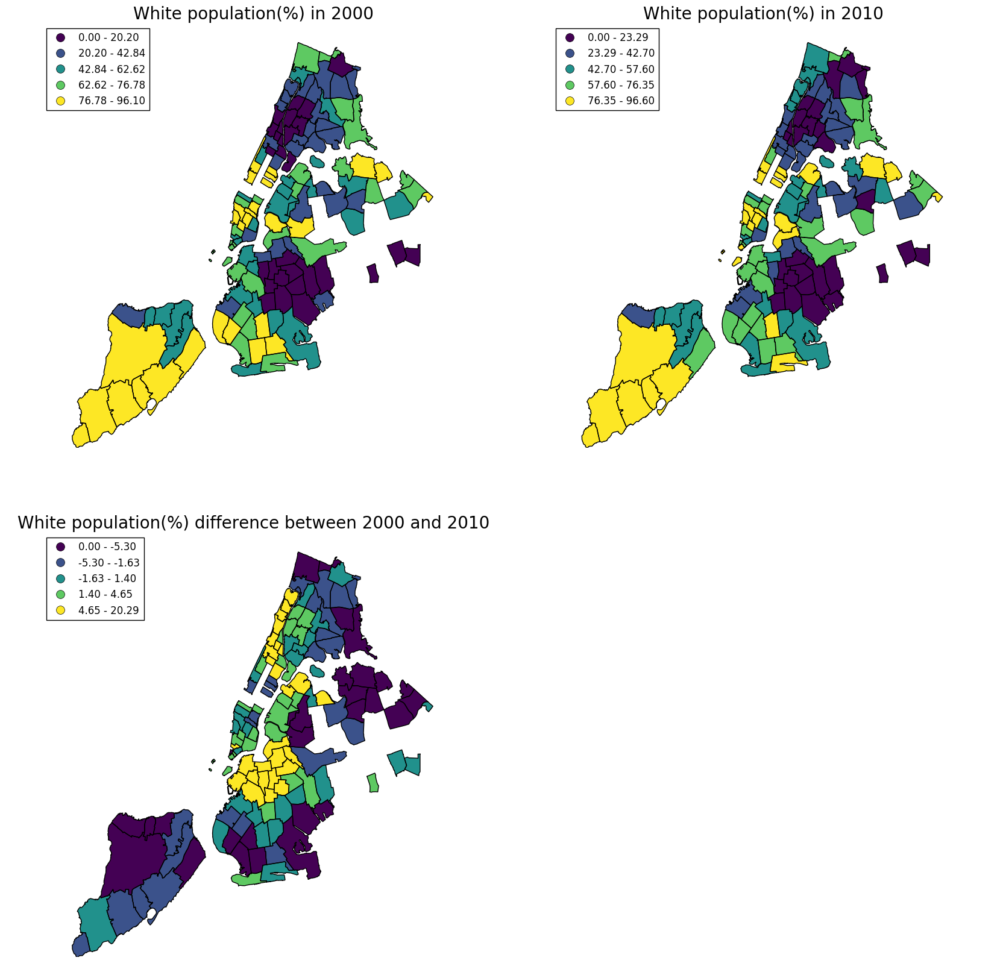

In [126]:
#White population(%)
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
nycCTZC.plot(column = 'White_pop(%)_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("White population(%) in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
nycCTZC.plot(column = 'White_pop(%)_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("White population(%) in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
nycCTZC.plot(column = 'WhitePop(%)_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("White population(%) difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 21 shows the White population(%) census tract in NYC in 2000, yellow means more people, so that we can see the white population on Mahattan midtown and staten island is obviously lager than others.
#### Figure 22  shows the White population(%) census tract in NYC in 2010, yellow means more people, so that we can see the white population on Mahattan midtown and staten islandis obviously lager than others.
#### FIgure 23 shows the White population(%) changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown, and the increase mostly happened in brooklyn downtown and Manhattan uptown.

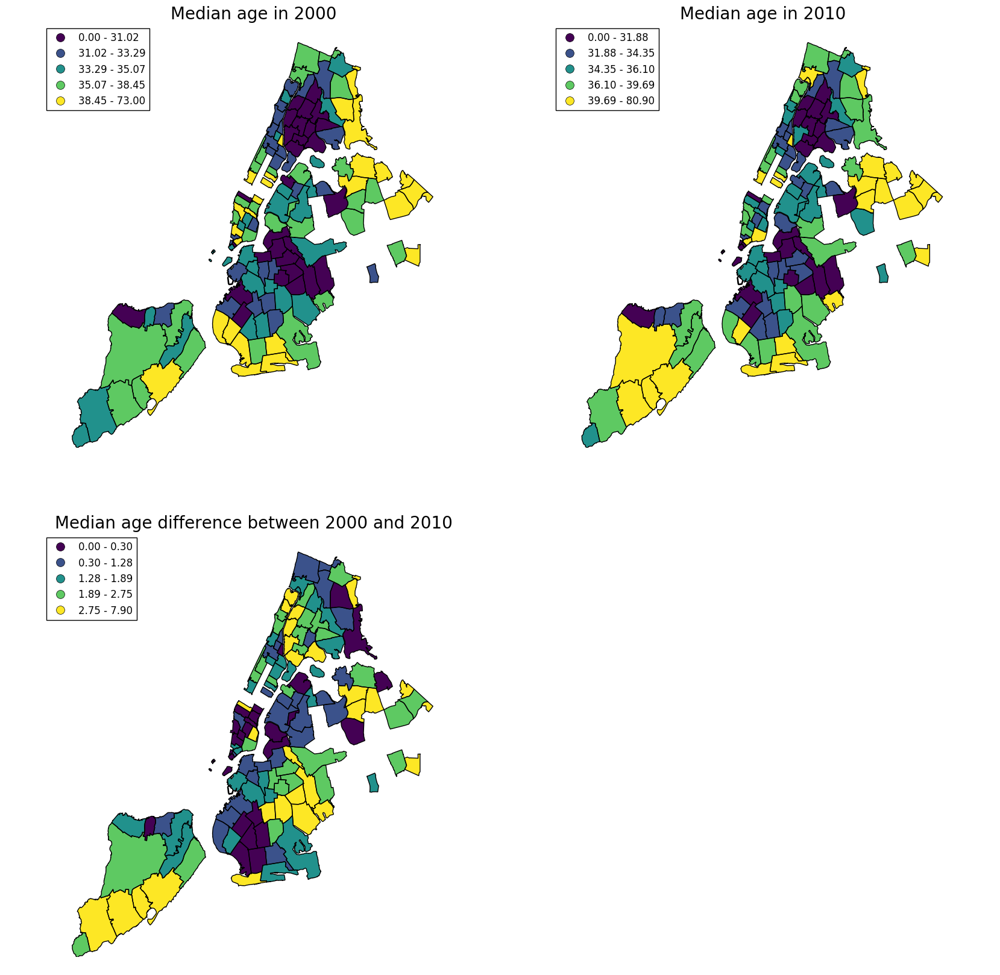

In [127]:
#Median age 
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
nycCTZC.plot(column = 'Age_m_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Median age in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
nycCTZC.plot(column = 'Age_m_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Median age in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
nycCTZC.plot(column = 'Age_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Median age difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 24 shows the Median age census tract in NYC in 2000, yellow means elder people, so that we can see the seniors are sparsely distributed around NYC.
#### Figure 25  shows the  Median age census tract in NYC in 2010, yellow means elder people, so that we can see the seniors are sparsely distributed around NYC.
#### FIgure 26 shows the  Median age changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown and brooklyn downtown and the increase mostly happened in stetan island.

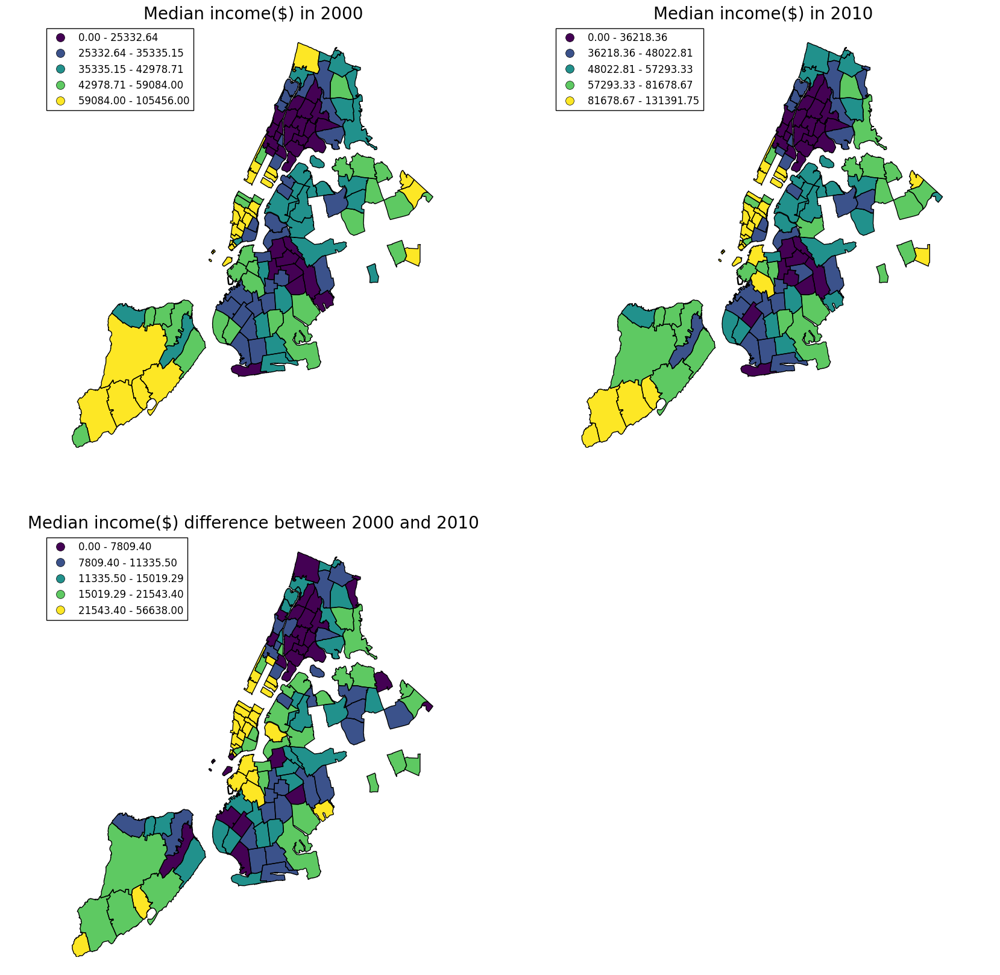

In [128]:
#Median Income
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
nycCTZC.plot(column = 'Income_m($)_00' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Median income($) in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
nycCTZC.plot(column = 'Income_m($)_10' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Median income($) in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
nycCTZC.plot(column = 'Income_diff' , colormap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Median income($) difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 27 shows the Meian income census tract in NYC in 2000, yellow means high income, so that we can see the the Median income in Manhattan and Stetan island is obviously higher than other area.
#### Figure 28  shows the  Median income census tract in NYC in 2010, yellow means high income, so that we can see the the Median income in Manhattan and Stetan island is obviously higher than other area.
#### FIgure 29 shows the  Median income changes in NYC between 2000 and 2010, we can see that there are generally increas for income in NYC from 2000 to 2010, especially for mahattan midtown and brooklyn downtown there are large increase of income.

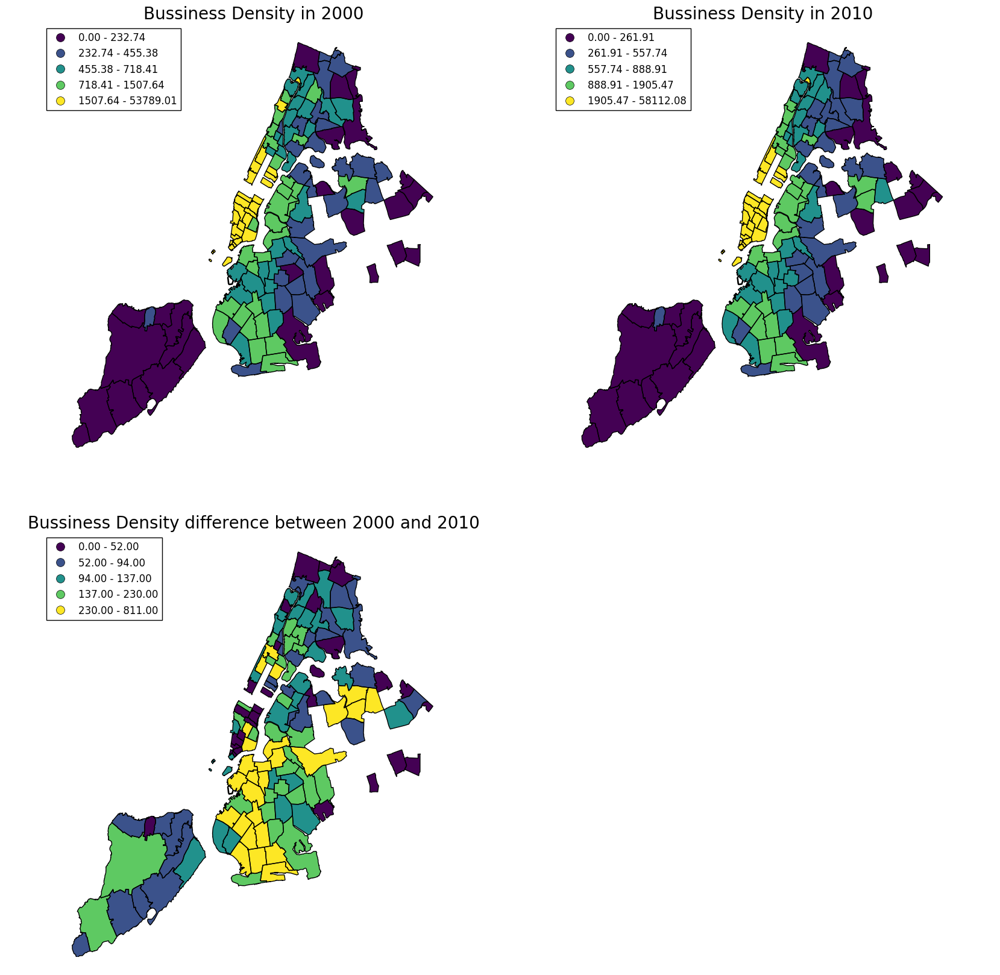

In [129]:
#Business Density
f, ax = pl.subplots(figsize = (20, 20))
ax1 = pl.subplot(221)
nycCTZC.plot(column = 'B_density_00' , cmap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax1)
ax1.set_title("Bussiness Density in 2000", fontsize = '20')
ax1.set_axis_off()

ax2 = pl.subplot(222)
nycCTZC.plot(column = 'B_density_10' , cmap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax2)
ax2.set_title("Bussiness Density in 2010", fontsize = '20')
ax2.set_axis_off()

ax3 = pl.subplot(223)
nycCTZC.plot(column = 'diff' , cmap ='viridis' ,alpha = 1, scheme = 'quantiles', legend = True, ax = ax3)
ax3.set_title("Bussiness Density difference between 2000 and 2010", fontsize = '20')
ax3.set_axis_off()   

#### Figure 30 shows the business density in NYC in 2000, yellow means larger density, so that we can see the desity on Manhattan midtown and downtown is obviously lager than others. 
#### Figure 31 shows the business density in NYC in 2010, yellow means larger density, so that we can see the desity on Manhattan midtown and downtown is obviously lager than others. 
#### FIgure 32 shows the business density changes in NYC between 2000 and 2010, we can see that there are slightly decreass in midtown, and the increase mostly happened in manhattan updown and brooklyn. 

#### 11) -> 8) Cluster the Zipcode on these five features (using a Eucledian distance)

In [313]:
# normalized data in 2000
CTZC_00 = nycCTZC[['ZIPCODE','geometry','B_density_00','Tot_pop_00','White_pop(%)_00',\
                   'Age_m_00','Income_m($)_00']]
#CTZC_00

In [314]:
ctzcN_00 = CTZC_00
ctzcN_00['B_density_00'] = ((CTZC_00.B_density_00 - CTZC_00.B_density_00.mean())/CTZC_00.B_density_00.std())
ctzcN_00['Tot_pop_00'] = ((CTZC_00.Tot_pop_00 - CTZC_00.Tot_pop_00.mean())/CTZC_00.Tot_pop_00.std())
ctzcN_00['White_pop(%)_00'] = ((CTZC_00['White_pop(%)_00'] - CTZC_00['White_pop(%)_00'].mean())/\
                               CTZC_00['White_pop(%)_00'].std())
ctzcN_00['Age_m_00'] = ((CTZC_00.Age_m_00 - CTZC_00.Age_m_00.mean())/CTZC_00.Age_m_00.std())
ctzcN_00['Income_m($)_00'] = ((CTZC_00['Income_m($)_00'] - CTZC_00['Income_m($)_00'].mean())/\
                              CTZC_00['Income_m($)_00'].std())
print ("I expect means of each feature to be = 0", ctzcN_00.mean(0))
print ("I expect stds of each row to be = 1", ctzcN_00.std(0))

('I expect means of each feature to be = 0', B_density_00       3.976331e-17
Tot_pop_00         2.196824e-16
White_pop(%)_00    2.757841e-16
Age_m_00          -7.779435e-16
Income_m($)_00    -7.898528e-18
dtype: float64)
('I expect stds of each row to be = 1', B_density_00       1.0
Tot_pop_00         1.0
White_pop(%)_00    1.0
Age_m_00           1.0
Income_m($)_00     1.0
dtype: float64)


/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

In [315]:
# normalized data in 2010
CTZC_10 = nycCTZC[['ZIPCODE','geometry','B_density_10','Tot_pop_10','White_pop(%)_10',\
                   'Age_m_10','Income_m($)_10']]
#CTZC_00

In [316]:
ctzcN_10 = CTZC_10
ctzcN_10['B_density_10'] = ((CTZC_10.B_density_10 - CTZC_10.B_density_10.mean())/CTZC_10.B_density_10.std())
ctzcN_10['Tot_pop_10'] = ((CTZC_10.Tot_pop_10 - CTZC_10.Tot_pop_10.mean())/CTZC_10.Tot_pop_10.std())
ctzcN_10['White_pop(%)_10'] = ((CTZC_10['White_pop(%)_10'] - CTZC_10['White_pop(%)_10'].mean())/\
                               CTZC_10['White_pop(%)_10'].std())
ctzcN_10['Age_m_10'] = ((CTZC_10.Age_m_10 - CTZC_10.Age_m_10.mean())/CTZC_10.Age_m_10.std())
ctzcN_10['Income_m($)_10'] = ((CTZC_10['Income_m($)_10'] - CTZC_10['Income_m($)_10'].mean())/\
                              CTZC_10['Income_m($)_10'].std())
print ("I expect means of each feature to be = 0", ctzcN_10.mean(0))
print ("I expect stds of each row to be = 1", ctzcN_10.std(0))

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

('I expect means of each feature to be = 0', B_density_10      -1.240143e-16
Tot_pop_10         1.669271e-16
White_pop(%)_10    1.822321e-16
Age_m_10          -7.125900e-16
Income_m($)_10    -4.191080e-16
dtype: float64)
('I expect stds of each row to be = 1', B_density_10       1.0
Tot_pop_10         1.0
White_pop(%)_10    1.0
Age_m_10           1.0
Income_m($)_10     1.0
dtype: float64)


In [317]:
#Cluster the Zipcode on these five features in 2000
nc = 5
km_00 = KMeans(n_clusters = nc, random_state = 444)
km_00.fit(ctzcN_00.iloc[:,2:])

KMeans(copy_x=True, init='k-means++', max_iter=300, n_clusters=5, n_init=10,
    n_jobs=1, precompute_distances='auto', random_state=444, tol=0.0001,
    verbose=0)

In [318]:
km_10 = KMeans(n_clusters = nc, random_state = 444, init = km_00.cluster_centers_)
km_10.fit(ctzcN_10.iloc[:,2:])

KMeans(copy_x=True,
    init=array([[-0.18027, -0.30847,  0.49924,  0.40916,  0.1141 ],
       [-0.32387,  0.1148 , -0.99293, -0.65947, -0.79516],
       [ 2.97606, -1.48226,  0.74344, -0.42846,  2.02721],
       [ 0.34621,  1.56145,  1.12467,  0.53937,  1.304  ],
       [-0.39501, -1.04545,  1.7077 ,  7.17859,  0.60152]]),
    max_iter=300, n_clusters=5, n_init=10, n_jobs=1,
    precompute_distances='auto', random_state=444, tol=0.0001, verbose=0)

In [319]:
ctzcN_00['Label_00'] = km_00.labels_
ctzcN_10['Label_10'] = km_10.labels_


/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [320]:
ctzcN_10['Label_change'] = ctzcN_10['Label_10'] - ctzcN_00['Label_00']

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


cluster centers in 2000


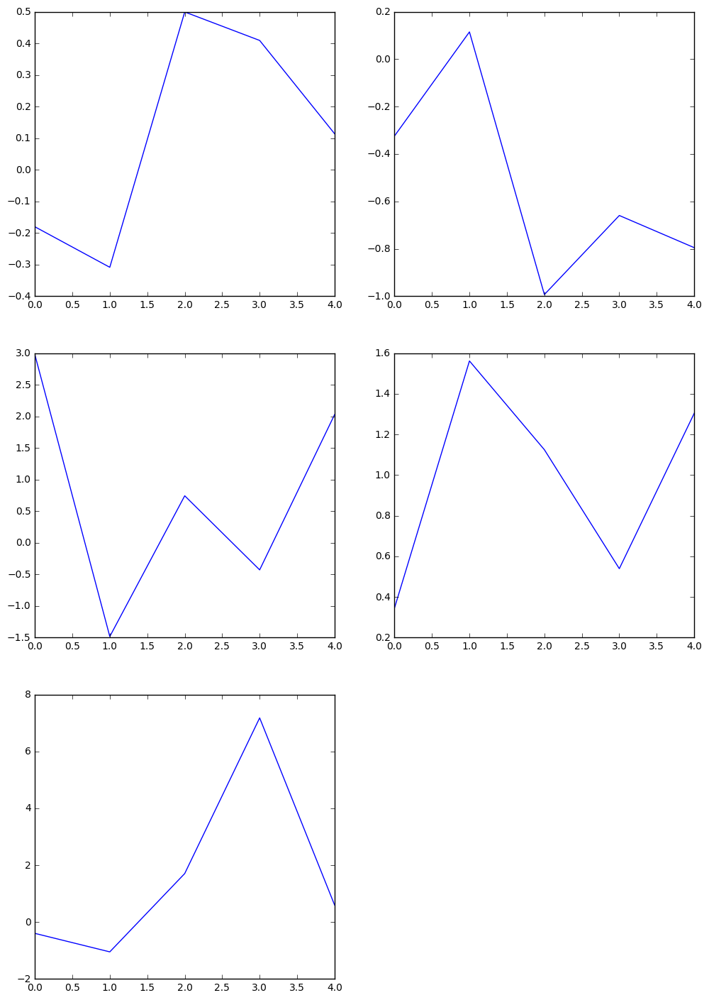

In [321]:
fig = pl.figure(figsize = (12,30))
for i,Xc in enumerate(km_00.cluster_centers_):
    ax = fig.add_subplot(5,2,(i+1))
    ax.plot(Xc)

print ("cluster centers in 2000")

#### Figure 33. 5 Clusters center for 2000's dataset plot

cluster centers in 2010


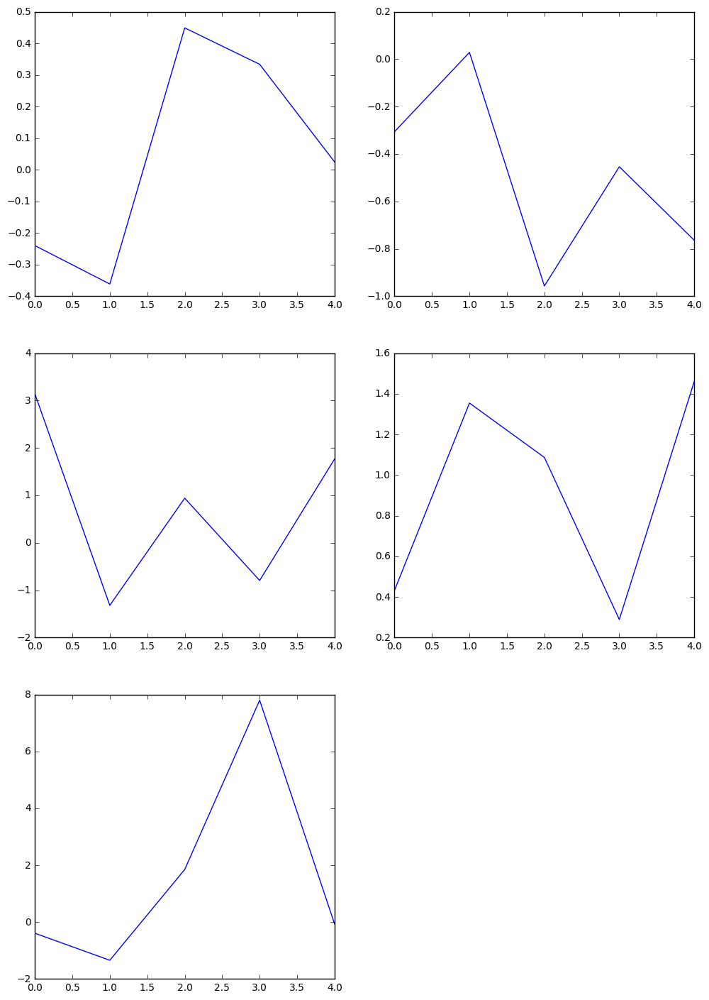

In [217]:
#features = pd.array('B_density_10', 'Tot_pop_10','Tot_pop_10', 'White_pop(%)_10', 'Age_m_10',\ 
#                    'Income_m($)_10')
fig = pl.figure(figsize = (12,30))
for i,Xc in enumerate(km_10.cluster_centers_):
    ax = fig.add_subplot(5,2,(i+1))
    ax.plot(Xc)
    #ax.set_xticklabels(features)
    
    #pl.xticks(fontsize = 20, rotation=75)
    #ax.set_yticklabels([''*len(ax.get_xticklabels())])
print ("cluster centers in 2010")

#### Figure 34. 5 Clusters center for 2010's dataset plot

#### 11) -> 9) Identify the census tracts that have changed cluster assignment (those that are now associated with a different group of census tracts) and show a choropleth of the clusters in 2010, 2000 and a choropleth of the cluster changes. (Once you get through this, you have done most of the heavy lifting! The rest is building upon this work.)

In [322]:
def choropleth(gdf, column, cmap , ax):
    gdf.plot(column = column, colormap = cmap,alpha = 1, axes = ax)
    vmin, vmax = min(gdf[column].values), \
            max(gdf[column].values)
    ax.axis('off')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap = cmap, norm = plt.Normalize(vmin = vmin, vmax = vmax))
    sm._A = []
    fig.colorbar(sm, cax = cax)



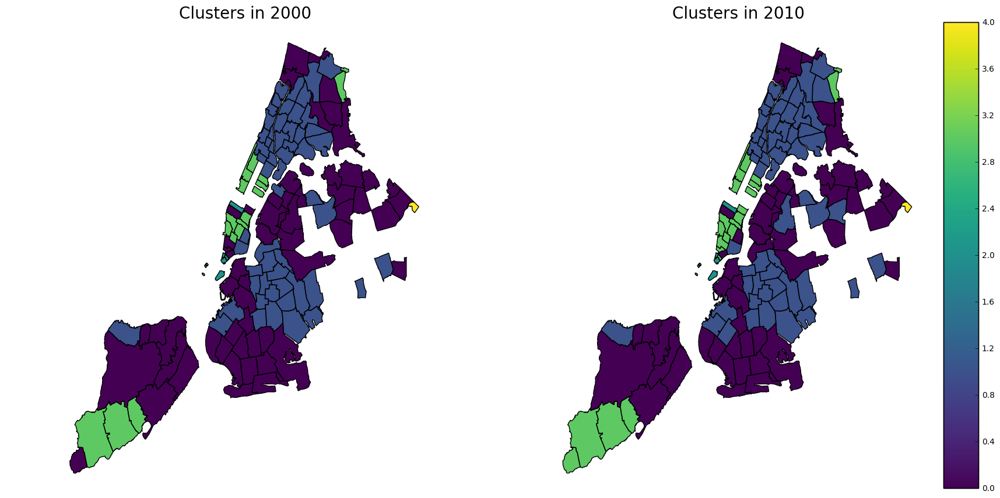

In [323]:
#Clustering plot
f, ax = pl.subplots(figsize = (20, 10))
ax1 = pl.subplot(121)
choropleth(ctzcN_00, 'Label_00', 'viridis', ax1)
ax1.set_title("Clusters in 2000", fontsize = '20')

ax2 = pl.subplot(122)
choropleth(ctzcN_10, 'Label_10', 'viridis', ax2)
ax2.set_title("Clusters in 2010", fontsize = '20')


#### Figure 35. Clustering(5) of 5 features plot for NYC(2000)
#### Figure 36. Clustering(5) of 5 features plot for NYC(2010)

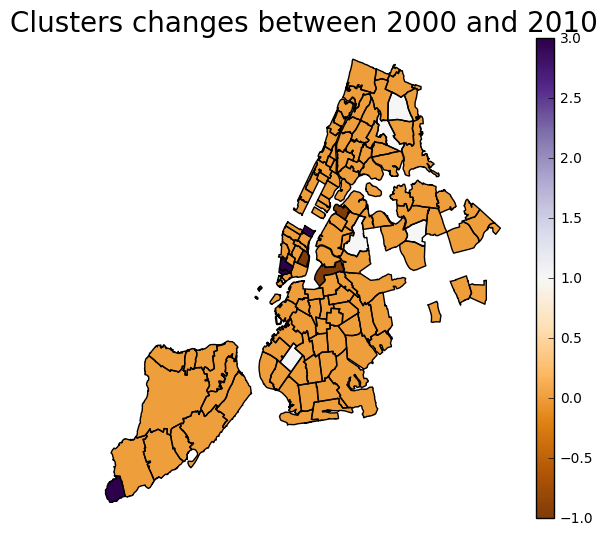

In [371]:
#ploting the changed clustering, any cluster that is not 0 is changed.
f, ax = pl.subplots(figsize = (6, 6))
choropleth(ctzcN_10, 'Label_change', 'PuOr', ax)
ax.set_title("Clusters changes between 2000 and 2010", fontsize = '20')

#### Figure 37. Cluster changes from 2000 to 2010, orange means 0, no changer over those 10 years. White is 1, means changed 1 cluster, respectivey, purpel means changed 3 clusters.

### 12) Define a function that given a dataframe containing the relevant information and two cluster labels finds if the census tract changed cluster assignments from the first to the second label, and if so finds the individual features that are significantly different as measured by Pearson's correlation, plot those zip codes, and plot a histogram of the features that have significantly changed. Run your function for all label pairs (2 points, one for the identification of locations that changed cluster and one for the identifiation of the features that changed significantly).

In [325]:
ctzcN_00['Label_change'] = ctzcN_10['Label_change']

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [330]:
ctzcN_00_c = ctzcN_00[ctzcN_00['Label_change'] != 0]
ctzcN_10_c = ctzcN_10[ctzcN_10['Label_change'] != 0]

In [331]:
def report_pearson( p, alpha, r):

    print('Result:')
    if p < alpha:
        print ( '%.2f is less than the significance level of %.2f, '%(p, alpha) +
               'which means that two distributions are correleated with correlation of %0.3f'%(r)) 
    else:
        print ( '%.2f is grater than the significance level of %.2f, '%(p, alpha)
               + 'which means that two distribution are uncorrelated.')

In [336]:
pearson_BD = scipy.stats.pearsonr(ctzcN_00_c.B_density_00, ctzcN_10_c.B_density_10)
print('Business density:')
report_pearson(pearson_BD[1], 0.05, pearson_BD[0])

Business density:
Result:
0.00 is less than the significance level of 0.05, which means that two distributions are correleated with correlation of 0.996


In [337]:
pearson_pop = scipy.stats.pearsonr(ctzcN_00_c.Tot_pop_00, ctzcN_10_c.Tot_pop_10)
print('Total population:')
report_pearson(pearson_pop[1], 0.05, pearson_pop[0])

Total population:
Result:
0.08 is grater than the significance level of 0.05, which means that two distribution are uncorrelated.


In [338]:
pearson_wp = scipy.stats.pearsonr(ctzcN_00_c['White_pop(%)_00'], ctzcN_10_c['White_pop(%)_10'])
print('White population percentage:')
report_pearson(pearson_wp[1], 0.05, pearson_wp[0])

White population percentage:
Result:
0.00 is less than the significance level of 0.05, which means that two distributions are correleated with correlation of 0.965


In [339]:
pearson_age = scipy.stats.pearsonr(ctzcN_00_c.Age_m_00, ctzcN_10_c.Age_m_10)
print('Median age:')
report_pearson(pearson_age[1], 0.05, pearson_age[0])

Median age:
Result:
0.00 is less than the significance level of 0.05, which means that two distributions are correleated with correlation of 0.842


In [340]:
pearson_ic = scipy.stats.pearsonr(ctzcN_00_c['Income_m($)_00'], ctzcN_10_c['Income_m($)_10'])
print('Median income:')
report_pearson(pearson_ic[1], 0.05, pearson_ic[0])

Median income:
Result:
0.00 is less than the significance level of 0.05, which means that two distributions are correleated with correlation of 0.978


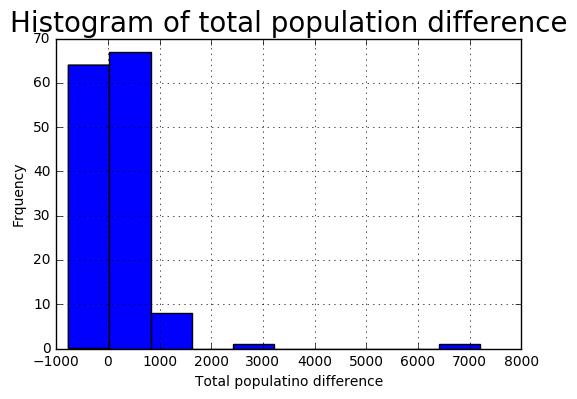

In [349]:
#Ploting the distribution of total population difference between 2000 and 2010
pl_po = nycCTZC['Tot_pop_diff'].hist()
pl_po.set_xlabel('Total populatino difference')
pl_po.set_ylabel('Frquency')
pl_po.set_title('Histogram of total population difference',fontsize = 20)


#### Figure 38. Hitogram of total pupulation differences over 10 years. We can conclude that most of the differences distributed from -1000 to 1000.

In [350]:
#Difine the threshold to select the abnormal zipcode
threshold_l = nycCTZC['Tot_pop_diff'].mean() - nycCTZC['Tot_pop_diff'].std()
threshold_h = nycCTZC['Tot_pop_diff'].mean() + nycCTZC['Tot_pop_diff'].std()

In [360]:
nycCTZC_abn = nycCTZC[nycCTZC['Tot_pop_diff'] < threshold_l]

In [361]:
nycCTZC_abn = nycCTZC_abn.append(nycCTZC[nycCTZC['Tot_pop_diff'] > threshold_h])

In [367]:
CTZC_10['Abnormal'] = np.zeros(len(ctzcN_10))
for i, zc in enumerate(ctzcN_10.ZIPCODE):
    for j, zc_a in enumerate(nycCTZC_abn.ZIPCODE):
        if zc == zc_a:
            CTZC_10['Abnormal'].iloc[i] = 1

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


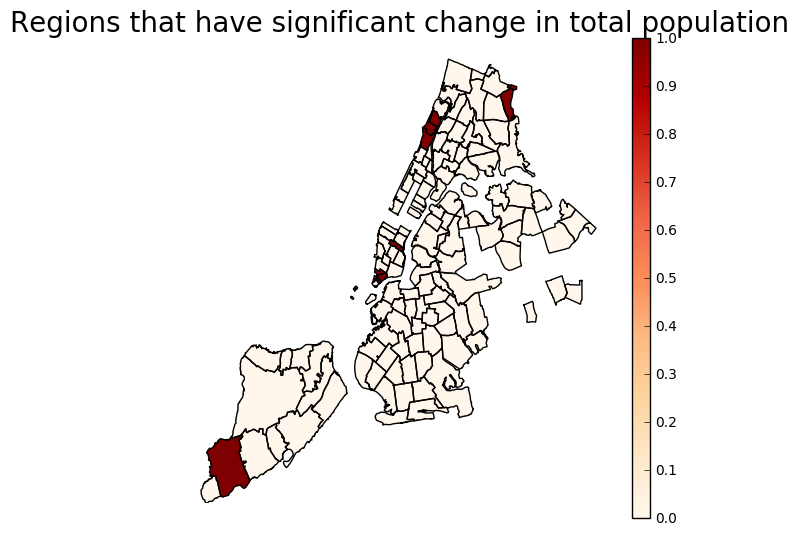

In [372]:
f, ax = pl.subplots(figsize = (6, 6))
choropleth(CTZC_10, 'Abnormal', 'OrRd', ax)
ax.set_title("Regions that have significant change in total population", fontsize = '20')

#### Figure 39. Ploting the zipcode area with significant difference between 2000's and 2010's total population.

### 13) Comment on the strength and weaknesses of this analysis, and on your findings (this is not the last step, but comments should be given throughout the notebook, and summarized here).

The strength of this analysis is that there are a lot of visulization of data, which can give us good expression of what happened between 2000 and 2010. Yet, since for census tract each cell is rather small, which makes choosing the right color map to be more important. By using the right color map, it will be much eaier to observe the phonomenon of the data and what kind of store the data wants to tell us. 

For conclusions, I found that for those 10 years, thought the number of those features changed, yet the pattern more or less kept the same. Meanwhile, the prosperous of Manhattan is expected, but there are minor trend for people to actually move to other places. Also, other boroughs are growing obviously, especially brooklyn area. 